<a href="https://colab.research.google.com/github/IvKorolev/Ml_hw/blob/main/Generate1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Скачиваем датасет
!wget http://www.soshnikov.com/permanent/data/petfaces.tar.gz

!tar xfz petfaces.tar.gz
!rm petfaces.tar.gz

--2026-04-23 19:29:18--  http://www.soshnikov.com/permanent/data/petfaces.tar.gz
Resolving www.soshnikov.com (www.soshnikov.com)... 79.137.227.122
Connecting to www.soshnikov.com (www.soshnikov.com)|79.137.227.122|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24483412 (23M) [application/x-tar]
Saving to: ‘petfaces.tar.gz’

petfaces.tar.gz     100%[===================>]  23.35M   122KB/s    in 3m 18s  

2026-04-23 19:32:37 (121 KB/s) - ‘petfaces.tar.gz’ saved [24483412/24483412]



In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import Dataset, DataLoader

In [ ]:
data_dir = 'petfaces'
filepaths = []
breeds = []
species =[]

for folder_name in os.listdir(data_dir):
    folder_path = os.path.join(data_dir, folder_name)

    if os.path.isdir(folder_path):
        parts = folder_name.split('_', 1)
        if len(parts) == 2:
            specie = parts[0]
            breed = parts[1]
        else:
            continue

        for file_name in os.listdir(folder_path):
            if file_name.endswith('.jpg'):
                filepaths.append(os.path.join(folder_path, file_name))
                breeds.append(breed)
                species.append(specie)

df = pd.DataFrame({
    'filepath': filepaths,
    'species': species,
    'breed': breeds
})

print(f"Всего изображений найдено: {len(df)}")

Всего изображений найдено: 3211


Пересядем на видюху

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Используемое устройство: {device}")

Используемое устройство: cuda


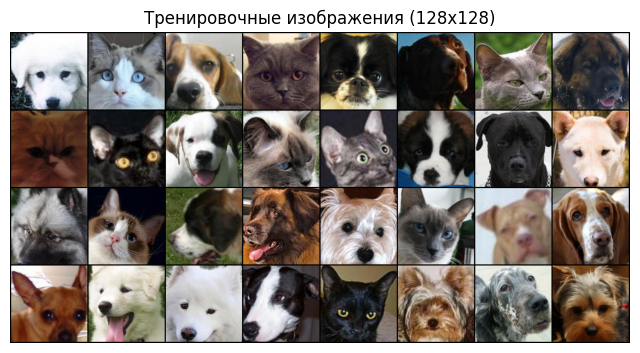

In [ ]:
image_size = 128
batch_size = 64

# Трансформсы
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

class PetFacesDataset(Dataset):
    def __init__(self, filepaths, transform=None):
        self.filepaths = filepaths
        self.transform = transform

    def __len__(self):
        return len(self.filepaths)

    def __getitem__(self, idx):
        img_path = self.filepaths[idx]
        image = Image.open(img_path).convert("RGB") # Защита от ч/б фото
        if self.transform:
            image = self.transform(image)
        return image

# Создаем Dataset и DataLoader
paths_list = df['filepath'].tolist()
dataset = PetFacesDataset(filepaths=paths_list, transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

# Покажем один батч (проверка, что всё работает)
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Тренировочные изображения (128x128)")
plt.imshow(np.transpose(vutils.make_grid(real_batch[:32], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

# Обучаем GAN

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [ ]:
nz = 100
ngf = 64
ndf = 64
nc = 3

class Generator128(nn.Module):
    def __init__(self):
        super(Generator128, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),

            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

class Discriminator128(nn.Module):
    def __init__(self):
        super(Discriminator128, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [ ]:
netG = Generator128().to(device)
netG.apply(weights_init)

netD = Discriminator128().to(device)
netD.apply(weights_init)

Discriminator128(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Dropout(p=0.3, inplace=False)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Dropout(p=0.3, inplace=False)
    (7): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (8): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Dropout(p=0.3, inplace=False)
    (11): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): LeakyReLU(negative_slope=0.2, inplace=True)
    (

[1/100][0/51] Loss_D: 2.4948 Loss_G: 2.7715
[1/100][25/51] Loss_D: 1.3199 Loss_G: 5.4658
[1/100][50/51] Loss_D: 1.1887 Loss_G: 2.6494
[2/100][0/51] Loss_D: 1.5735 Loss_G: 8.7683
[2/100][25/51] Loss_D: 0.9954 Loss_G: 9.3784
[2/100][50/51] Loss_D: 0.9940 Loss_G: 5.2171
[3/100][0/51] Loss_D: 1.4916 Loss_G: 4.5419
[3/100][25/51] Loss_D: 1.3551 Loss_G: 2.9735
[3/100][50/51] Loss_D: 1.9909 Loss_G: 11.2641
[4/100][0/51] Loss_D: 2.8318 Loss_G: 3.8109
[4/100][25/51] Loss_D: 0.5846 Loss_G: 5.9165
[4/100][50/51] Loss_D: 1.1156 Loss_G: 2.5688
[5/100][0/51] Loss_D: 0.7593 Loss_G: 4.2829
[5/100][25/51] Loss_D: 0.6927 Loss_G: 5.7451
[5/100][50/51] Loss_D: 0.8785 Loss_G: 4.1983


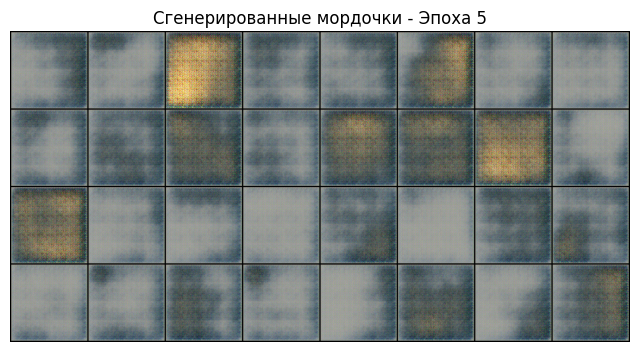

[6/100][0/51] Loss_D: 0.8679 Loss_G: 4.9058
[6/100][25/51] Loss_D: 1.5712 Loss_G: 5.5162
[6/100][50/51] Loss_D: 1.4135 Loss_G: 3.9424
[7/100][0/51] Loss_D: 1.3654 Loss_G: 2.3474
[7/100][25/51] Loss_D: 0.9145 Loss_G: 3.1613
[7/100][50/51] Loss_D: 1.1512 Loss_G: 4.3641
[8/100][0/51] Loss_D: 1.4125 Loss_G: 3.2162
[8/100][25/51] Loss_D: 0.7204 Loss_G: 2.8010
[8/100][50/51] Loss_D: 0.5314 Loss_G: 3.9976
[9/100][0/51] Loss_D: 0.6000 Loss_G: 3.9674
[9/100][25/51] Loss_D: 0.6913 Loss_G: 4.5622
[9/100][50/51] Loss_D: 0.9088 Loss_G: 5.4864
[10/100][0/51] Loss_D: 1.6664 Loss_G: 3.5293
[10/100][25/51] Loss_D: 1.0684 Loss_G: 5.9577
[10/100][50/51] Loss_D: 0.4901 Loss_G: 7.6808


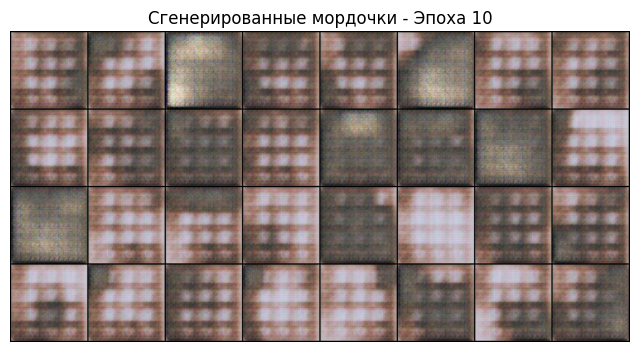

[11/100][0/51] Loss_D: 0.7604 Loss_G: 4.3281
[11/100][25/51] Loss_D: 0.6145 Loss_G: 4.1095
[11/100][50/51] Loss_D: 0.7507 Loss_G: 3.4491
[12/100][0/51] Loss_D: 0.9513 Loss_G: 3.0204
[12/100][25/51] Loss_D: 0.5662 Loss_G: 4.9427
[12/100][50/51] Loss_D: 1.6933 Loss_G: 11.1545
[13/100][0/51] Loss_D: 0.9505 Loss_G: 4.7743
[13/100][25/51] Loss_D: 0.4987 Loss_G: 5.2453
[13/100][50/51] Loss_D: 0.7291 Loss_G: 7.1215
[14/100][0/51] Loss_D: 1.1935 Loss_G: 4.3214
[14/100][25/51] Loss_D: 1.7350 Loss_G: 7.7788
[14/100][50/51] Loss_D: 0.7502 Loss_G: 2.7056
[15/100][0/51] Loss_D: 1.3109 Loss_G: 6.3847
[15/100][25/51] Loss_D: 0.8029 Loss_G: 3.4169
[15/100][50/51] Loss_D: 0.5212 Loss_G: 4.1723


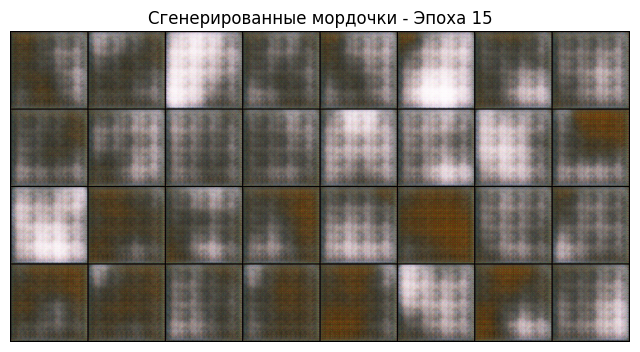

[16/100][0/51] Loss_D: 0.7205 Loss_G: 5.3250
[16/100][25/51] Loss_D: 0.5335 Loss_G: 5.4682
[16/100][50/51] Loss_D: 0.7766 Loss_G: 4.2391
[17/100][0/51] Loss_D: 0.6173 Loss_G: 3.8314
[17/100][25/51] Loss_D: 0.5932 Loss_G: 5.6886
[17/100][50/51] Loss_D: 1.4731 Loss_G: 4.7190
[18/100][0/51] Loss_D: 0.7252 Loss_G: 3.5118
[18/100][25/51] Loss_D: 0.5971 Loss_G: 3.7258
[18/100][50/51] Loss_D: 0.6677 Loss_G: 8.8063
[19/100][0/51] Loss_D: 0.6020 Loss_G: 6.0571
[19/100][25/51] Loss_D: 0.8196 Loss_G: 5.1464
[19/100][50/51] Loss_D: 1.6289 Loss_G: 7.6127
[20/100][0/51] Loss_D: 1.9657 Loss_G: 4.2385
[20/100][25/51] Loss_D: 0.7812 Loss_G: 2.8874
[20/100][50/51] Loss_D: 0.8869 Loss_G: 2.6335


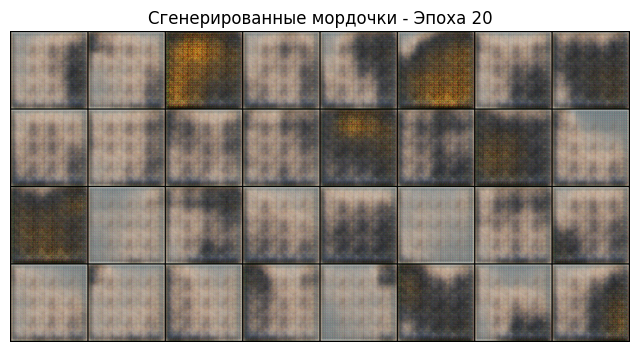

[21/100][0/51] Loss_D: 1.6389 Loss_G: 7.9403
[21/100][25/51] Loss_D: 0.9920 Loss_G: 2.6015
[21/100][50/51] Loss_D: 0.6616 Loss_G: 4.5727
[22/100][0/51] Loss_D: 0.9065 Loss_G: 2.4316
[22/100][25/51] Loss_D: 0.7974 Loss_G: 2.3787
[22/100][50/51] Loss_D: 0.6646 Loss_G: 4.2028
[23/100][0/51] Loss_D: 0.5557 Loss_G: 4.0233
[23/100][25/51] Loss_D: 1.8719 Loss_G: 3.4481
[23/100][50/51] Loss_D: 1.1996 Loss_G: 1.4795
[24/100][0/51] Loss_D: 1.1975 Loss_G: 4.0186
[24/100][25/51] Loss_D: 0.9624 Loss_G: 3.7967
[24/100][50/51] Loss_D: 1.9664 Loss_G: 1.3672
[25/100][0/51] Loss_D: 1.2294 Loss_G: 3.7578
[25/100][25/51] Loss_D: 1.0834 Loss_G: 3.8177
[25/100][50/51] Loss_D: 1.0225 Loss_G: 2.8092


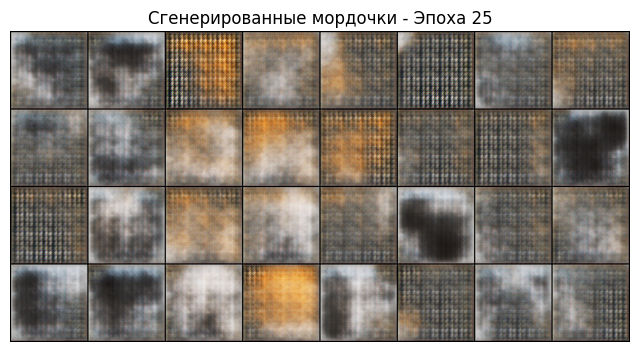

[26/100][0/51] Loss_D: 1.4063 Loss_G: 5.1609
[26/100][25/51] Loss_D: 1.1170 Loss_G: 5.2040
[26/100][50/51] Loss_D: 0.8953 Loss_G: 3.3845
[27/100][0/51] Loss_D: 1.9474 Loss_G: 5.0875
[27/100][25/51] Loss_D: 1.2383 Loss_G: 4.1641
[27/100][50/51] Loss_D: 1.4373 Loss_G: 5.2196
[28/100][0/51] Loss_D: 1.3452 Loss_G: 3.3173
[28/100][25/51] Loss_D: 0.8408 Loss_G: 3.1759
[28/100][50/51] Loss_D: 1.0333 Loss_G: 5.1678
[29/100][0/51] Loss_D: 0.8682 Loss_G: 5.3228
[29/100][25/51] Loss_D: 1.0208 Loss_G: 3.7783
[29/100][50/51] Loss_D: 1.0137 Loss_G: 4.8137
[30/100][0/51] Loss_D: 1.0226 Loss_G: 4.6027
[30/100][25/51] Loss_D: 0.9157 Loss_G: 3.8393
[30/100][50/51] Loss_D: 1.7542 Loss_G: 7.8386


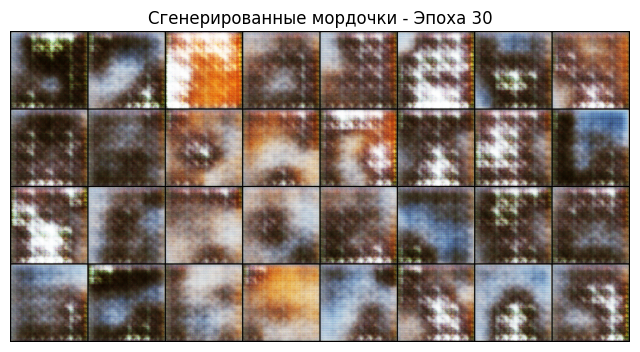

[31/100][0/51] Loss_D: 1.4151 Loss_G: 3.9696
[31/100][25/51] Loss_D: 1.2981 Loss_G: 2.6161
[31/100][50/51] Loss_D: 0.8386 Loss_G: 5.8788
[32/100][0/51] Loss_D: 0.9466 Loss_G: 5.0576
[32/100][25/51] Loss_D: 0.9810 Loss_G: 4.9744
[32/100][50/51] Loss_D: 1.6742 Loss_G: 2.1806
[33/100][0/51] Loss_D: 1.8670 Loss_G: 5.6705
[33/100][25/51] Loss_D: 0.8646 Loss_G: 2.9121
[33/100][50/51] Loss_D: 0.9972 Loss_G: 2.7169
[34/100][0/51] Loss_D: 1.2830 Loss_G: 6.1492
[34/100][25/51] Loss_D: 1.1772 Loss_G: 2.8199
[34/100][50/51] Loss_D: 0.7924 Loss_G: 3.8410
[35/100][0/51] Loss_D: 1.2165 Loss_G: 3.9998
[35/100][25/51] Loss_D: 1.1663 Loss_G: 2.2190
[35/100][50/51] Loss_D: 1.3173 Loss_G: 2.6789


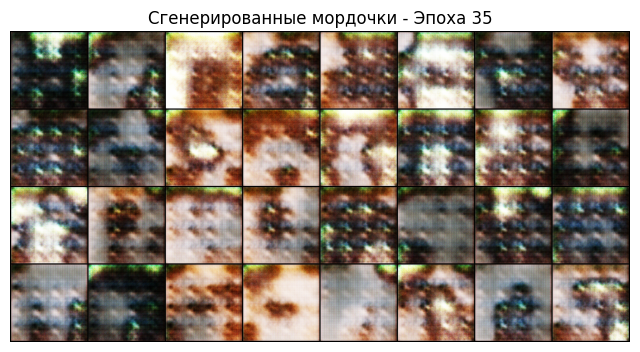

[36/100][0/51] Loss_D: 0.9779 Loss_G: 4.6525
[36/100][25/51] Loss_D: 1.3896 Loss_G: 1.9535
[36/100][50/51] Loss_D: 0.9140 Loss_G: 3.4356
[37/100][0/51] Loss_D: 1.6156 Loss_G: 3.0815
[37/100][25/51] Loss_D: 1.0653 Loss_G: 2.2892
[37/100][50/51] Loss_D: 0.8473 Loss_G: 3.7101
[38/100][0/51] Loss_D: 1.0738 Loss_G: 2.7532
[38/100][25/51] Loss_D: 1.2123 Loss_G: 3.9696
[38/100][50/51] Loss_D: 1.1182 Loss_G: 2.6026
[39/100][0/51] Loss_D: 1.5420 Loss_G: 6.0990
[39/100][25/51] Loss_D: 1.1203 Loss_G: 4.4157
[39/100][50/51] Loss_D: 1.5532 Loss_G: 5.7600
[40/100][0/51] Loss_D: 1.1872 Loss_G: 3.1790
[40/100][25/51] Loss_D: 0.9444 Loss_G: 3.9634
[40/100][50/51] Loss_D: 0.9337 Loss_G: 2.2718


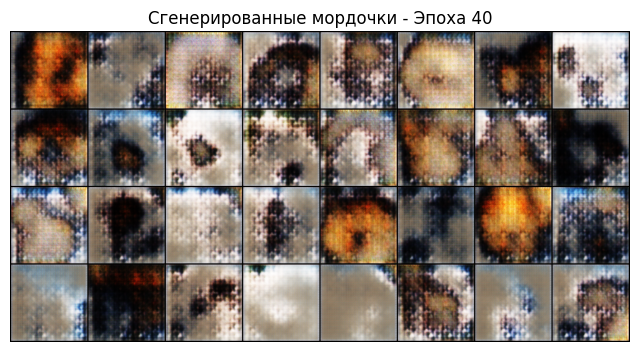

[41/100][0/51] Loss_D: 1.2685 Loss_G: 3.4236
[41/100][25/51] Loss_D: 0.9772 Loss_G: 3.5130
[41/100][50/51] Loss_D: 1.7889 Loss_G: 4.5400
[42/100][0/51] Loss_D: 0.9994 Loss_G: 2.7340
[42/100][25/51] Loss_D: 1.0026 Loss_G: 3.9442
[42/100][50/51] Loss_D: 1.7054 Loss_G: 1.4006
[43/100][0/51] Loss_D: 1.5276 Loss_G: 4.1746
[43/100][25/51] Loss_D: 1.2587 Loss_G: 1.8991
[43/100][50/51] Loss_D: 1.1565 Loss_G: 1.7802
[44/100][0/51] Loss_D: 1.7371 Loss_G: 4.8790
[44/100][25/51] Loss_D: 1.2462 Loss_G: 5.1539
[44/100][50/51] Loss_D: 1.7630 Loss_G: 5.8960
[45/100][0/51] Loss_D: 1.0149 Loss_G: 3.0205
[45/100][25/51] Loss_D: 0.8677 Loss_G: 3.9283
[45/100][50/51] Loss_D: 1.3420 Loss_G: 5.5134


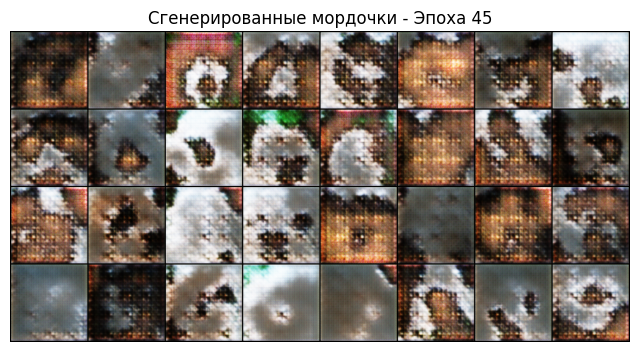

[46/100][0/51] Loss_D: 1.2306 Loss_G: 2.3183
[46/100][25/51] Loss_D: 0.8096 Loss_G: 3.3507
[46/100][50/51] Loss_D: 1.4928 Loss_G: 2.0934
[47/100][0/51] Loss_D: 1.3750 Loss_G: 3.7379
[47/100][25/51] Loss_D: 1.0027 Loss_G: 3.1330
[47/100][50/51] Loss_D: 1.3368 Loss_G: 3.5119
[48/100][0/51] Loss_D: 1.1043 Loss_G: 3.8388
[48/100][25/51] Loss_D: 1.2597 Loss_G: 3.7477
[48/100][50/51] Loss_D: 1.0404 Loss_G: 1.8452
[49/100][0/51] Loss_D: 1.9531 Loss_G: 5.0158
[49/100][25/51] Loss_D: 0.8721 Loss_G: 2.7202
[49/100][50/51] Loss_D: 1.0638 Loss_G: 5.6855
[50/100][0/51] Loss_D: 1.4594 Loss_G: 2.3671
[50/100][25/51] Loss_D: 1.1923 Loss_G: 4.2814
[50/100][50/51] Loss_D: 1.3544 Loss_G: 4.4920


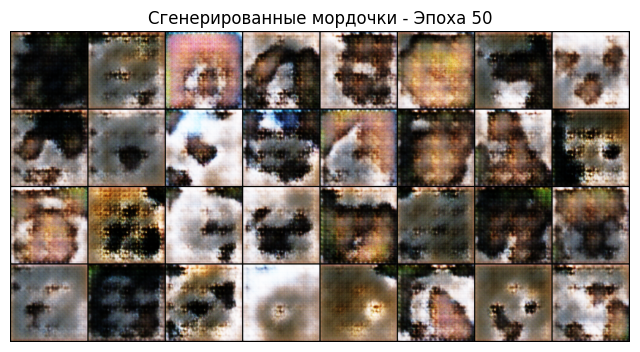

[51/100][0/51] Loss_D: 1.2149 Loss_G: 4.1576
[51/100][25/51] Loss_D: 0.9215 Loss_G: 3.1989
[51/100][50/51] Loss_D: 1.0043 Loss_G: 3.0109
[52/100][0/51] Loss_D: 1.1311 Loss_G: 3.0822
[52/100][25/51] Loss_D: 1.5561 Loss_G: 2.2911
[52/100][50/51] Loss_D: 1.9962 Loss_G: 3.0594
[53/100][0/51] Loss_D: 0.9996 Loss_G: 2.3112
[53/100][25/51] Loss_D: 1.4354 Loss_G: 4.1058
[53/100][50/51] Loss_D: 1.6340 Loss_G: 4.9653
[54/100][0/51] Loss_D: 1.1886 Loss_G: 3.3653
[54/100][25/51] Loss_D: 2.2926 Loss_G: 2.0198
[54/100][50/51] Loss_D: 1.4364 Loss_G: 2.2507
[55/100][0/51] Loss_D: 1.5464 Loss_G: 4.0308
[55/100][25/51] Loss_D: 0.8527 Loss_G: 3.3038
[55/100][50/51] Loss_D: 1.0341 Loss_G: 2.9643


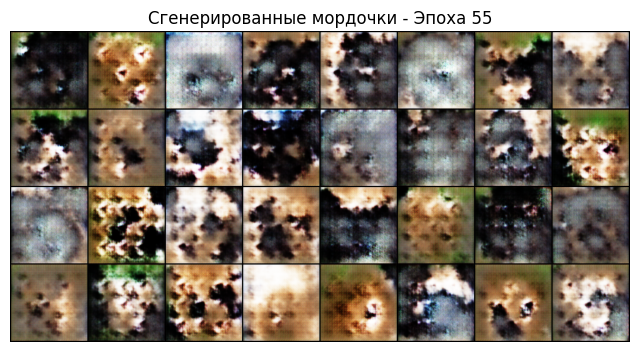

[56/100][0/51] Loss_D: 0.9490 Loss_G: 2.6376
[56/100][25/51] Loss_D: 1.1913 Loss_G: 2.0338
[56/100][50/51] Loss_D: 1.1825 Loss_G: 2.5797
[57/100][0/51] Loss_D: 1.2125 Loss_G: 3.9512
[57/100][25/51] Loss_D: 0.6884 Loss_G: 3.8708
[57/100][50/51] Loss_D: 1.6352 Loss_G: 1.2400
[58/100][0/51] Loss_D: 1.7986 Loss_G: 3.2807
[58/100][25/51] Loss_D: 1.0433 Loss_G: 4.0109
[58/100][50/51] Loss_D: 1.2263 Loss_G: 1.5908
[59/100][0/51] Loss_D: 1.7021 Loss_G: 3.7029
[59/100][25/51] Loss_D: 1.1744 Loss_G: 3.1878
[59/100][50/51] Loss_D: 1.0070 Loss_G: 3.1857
[60/100][0/51] Loss_D: 1.1294 Loss_G: 3.4941
[60/100][25/51] Loss_D: 1.0848 Loss_G: 2.1333
[60/100][50/51] Loss_D: 1.5487 Loss_G: 2.3846


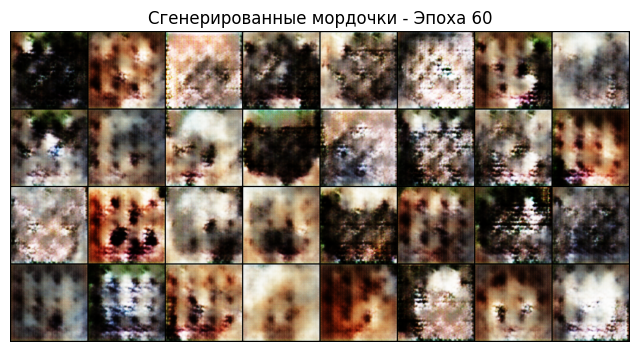

[61/100][0/51] Loss_D: 1.5781 Loss_G: 5.6871
[61/100][25/51] Loss_D: 0.7615 Loss_G: 3.9689
[61/100][50/51] Loss_D: 1.4754 Loss_G: 1.2149
[62/100][0/51] Loss_D: 1.3337 Loss_G: 3.6127
[62/100][25/51] Loss_D: 1.0559 Loss_G: 2.8651
[62/100][50/51] Loss_D: 1.2796 Loss_G: 2.3051
[63/100][0/51] Loss_D: 1.4108 Loss_G: 4.2825
[63/100][25/51] Loss_D: 0.9240 Loss_G: 3.1664
[63/100][50/51] Loss_D: 1.6210 Loss_G: 0.9901
[64/100][0/51] Loss_D: 1.6871 Loss_G: 4.9137
[64/100][25/51] Loss_D: 1.1585 Loss_G: 4.1616
[64/100][50/51] Loss_D: 1.2527 Loss_G: 5.0967
[65/100][0/51] Loss_D: 0.6811 Loss_G: 4.7141
[65/100][25/51] Loss_D: 0.7508 Loss_G: 3.0431
[65/100][50/51] Loss_D: 1.9644 Loss_G: 1.1890


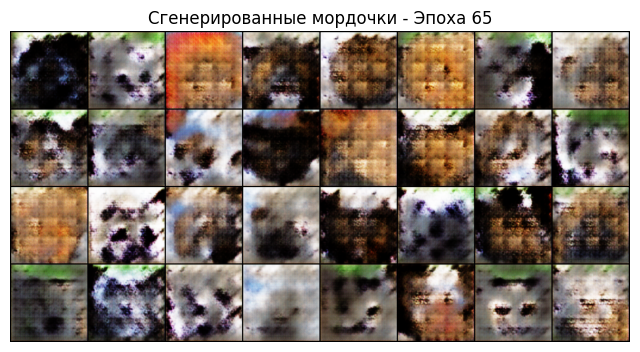

[66/100][0/51] Loss_D: 1.4559 Loss_G: 3.0652
[66/100][25/51] Loss_D: 0.8671 Loss_G: 5.3254
[66/100][50/51] Loss_D: 1.1147 Loss_G: 3.3888
[67/100][0/51] Loss_D: 1.1971 Loss_G: 1.8409
[67/100][25/51] Loss_D: 1.0636 Loss_G: 2.2949
[67/100][50/51] Loss_D: 1.5351 Loss_G: 2.3051
[68/100][0/51] Loss_D: 1.7021 Loss_G: 6.2186
[68/100][25/51] Loss_D: 1.1064 Loss_G: 2.0176
[68/100][50/51] Loss_D: 1.2127 Loss_G: 3.1337
[69/100][0/51] Loss_D: 1.0387 Loss_G: 4.4138
[69/100][25/51] Loss_D: 0.8228 Loss_G: 2.7430
[69/100][50/51] Loss_D: 0.7541 Loss_G: 2.0436
[70/100][0/51] Loss_D: 1.6547 Loss_G: 5.0209
[70/100][25/51] Loss_D: 0.8261 Loss_G: 2.9926
[70/100][50/51] Loss_D: 0.8271 Loss_G: 2.3677


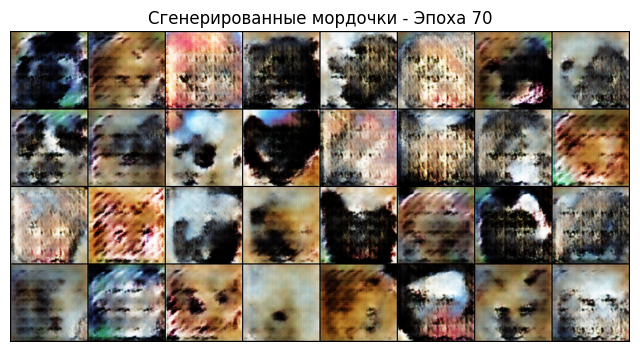

[71/100][0/51] Loss_D: 1.1611 Loss_G: 4.3899
[71/100][25/51] Loss_D: 0.8870 Loss_G: 2.8212
[71/100][50/51] Loss_D: 0.8645 Loss_G: 4.5335
[72/100][0/51] Loss_D: 1.1365 Loss_G: 1.9913
[72/100][25/51] Loss_D: 0.8632 Loss_G: 2.6372
[72/100][50/51] Loss_D: 1.0370 Loss_G: 6.2843
[73/100][0/51] Loss_D: 0.9709 Loss_G: 2.2480
[73/100][25/51] Loss_D: 1.0969 Loss_G: 3.9769
[73/100][50/51] Loss_D: 0.6328 Loss_G: 3.8165
[74/100][0/51] Loss_D: 0.7688 Loss_G: 3.3549
[74/100][25/51] Loss_D: 0.7243 Loss_G: 2.4051
[74/100][50/51] Loss_D: 0.6158 Loss_G: 1.9831
[75/100][0/51] Loss_D: 1.1626 Loss_G: 4.7404
[75/100][25/51] Loss_D: 0.7336 Loss_G: 3.0944
[75/100][50/51] Loss_D: 2.3304 Loss_G: 0.8043


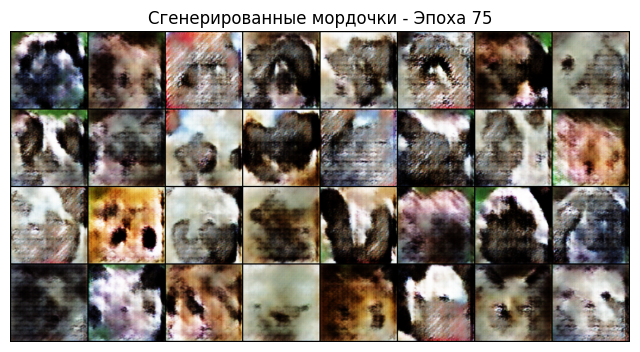

[76/100][0/51] Loss_D: 1.8656 Loss_G: 5.1759
[76/100][25/51] Loss_D: 0.7490 Loss_G: 3.4500
[76/100][50/51] Loss_D: 1.4106 Loss_G: 1.3059
[77/100][0/51] Loss_D: 1.6613 Loss_G: 4.8503
[77/100][25/51] Loss_D: 0.8133 Loss_G: 3.9043
[77/100][50/51] Loss_D: 1.0625 Loss_G: 2.2742
[78/100][0/51] Loss_D: 0.8473 Loss_G: 4.1758
[78/100][25/51] Loss_D: 0.8232 Loss_G: 3.6064
[78/100][50/51] Loss_D: 0.7532 Loss_G: 3.6409
[79/100][0/51] Loss_D: 0.8426 Loss_G: 2.7756
[79/100][25/51] Loss_D: 0.7808 Loss_G: 2.3168
[79/100][50/51] Loss_D: 0.6805 Loss_G: 4.1258
[80/100][0/51] Loss_D: 0.8835 Loss_G: 4.0883
[80/100][25/51] Loss_D: 0.7787 Loss_G: 4.9406
[80/100][50/51] Loss_D: 1.2921 Loss_G: 2.1354


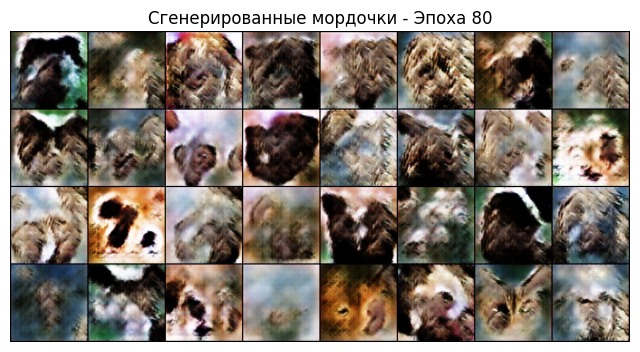

[81/100][0/51] Loss_D: 1.3281 Loss_G: 5.3497
[81/100][25/51] Loss_D: 0.9787 Loss_G: 4.1019
[81/100][50/51] Loss_D: 0.9091 Loss_G: 6.0226
[82/100][0/51] Loss_D: 0.9260 Loss_G: 2.4039
[82/100][25/51] Loss_D: 0.8708 Loss_G: 4.2996
[82/100][50/51] Loss_D: 0.6559 Loss_G: 3.0323
[83/100][0/51] Loss_D: 0.8363 Loss_G: 4.5452
[83/100][25/51] Loss_D: 0.9212 Loss_G: 4.6735
[83/100][50/51] Loss_D: 0.5039 Loss_G: 3.6446
[84/100][0/51] Loss_D: 0.8413 Loss_G: 5.6108
[84/100][25/51] Loss_D: 0.7103 Loss_G: 3.3449
[84/100][50/51] Loss_D: 0.9885 Loss_G: 3.8525
[85/100][0/51] Loss_D: 0.8632 Loss_G: 4.3727
[85/100][25/51] Loss_D: 0.8633 Loss_G: 3.4487
[85/100][50/51] Loss_D: 1.0075 Loss_G: 5.4173


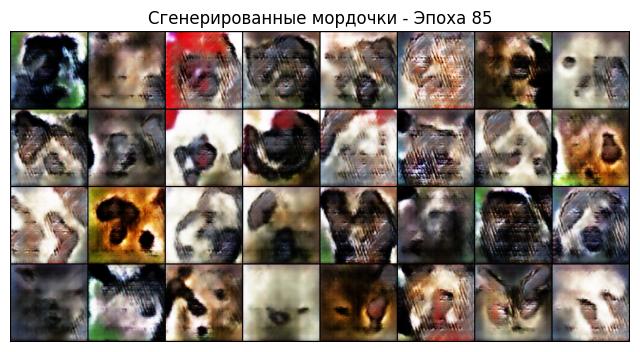

[86/100][0/51] Loss_D: 0.6654 Loss_G: 3.1153
[86/100][25/51] Loss_D: 0.6057 Loss_G: 2.8894
[86/100][50/51] Loss_D: 0.5380 Loss_G: 4.0897
[87/100][0/51] Loss_D: 0.7494 Loss_G: 3.0112
[87/100][25/51] Loss_D: 0.7947 Loss_G: 4.1635
[87/100][50/51] Loss_D: 0.5528 Loss_G: 2.9124
[88/100][0/51] Loss_D: 0.6861 Loss_G: 2.8853
[88/100][25/51] Loss_D: 1.2076 Loss_G: 1.5549
[88/100][50/51] Loss_D: 0.5670 Loss_G: 5.5067
[89/100][0/51] Loss_D: 1.1682 Loss_G: 2.0124
[89/100][25/51] Loss_D: 0.8552 Loss_G: 3.0519
[89/100][50/51] Loss_D: 1.5847 Loss_G: 1.9986
[90/100][0/51] Loss_D: 1.0300 Loss_G: 2.7528
[90/100][25/51] Loss_D: 0.7989 Loss_G: 2.2942
[90/100][50/51] Loss_D: 0.9532 Loss_G: 5.1009


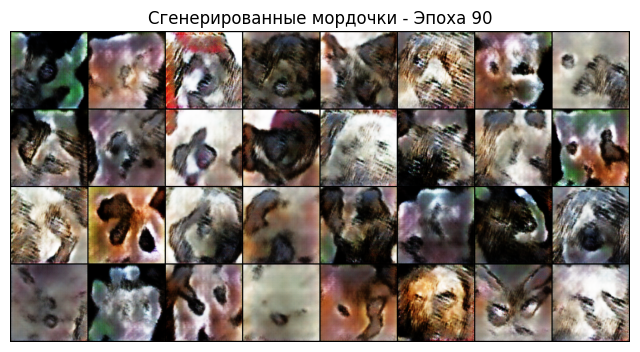

[91/100][0/51] Loss_D: 0.7453 Loss_G: 2.9388
[91/100][25/51] Loss_D: 2.3489 Loss_G: 1.7735
[91/100][50/51] Loss_D: 0.9109 Loss_G: 2.7947
[92/100][0/51] Loss_D: 0.7679 Loss_G: 3.0264
[92/100][25/51] Loss_D: 0.9306 Loss_G: 3.1909
[92/100][50/51] Loss_D: 0.5076 Loss_G: 2.7523
[93/100][0/51] Loss_D: 0.8874 Loss_G: 3.2979
[93/100][25/51] Loss_D: 0.7669 Loss_G: 4.3744
[93/100][50/51] Loss_D: 1.4094 Loss_G: 0.8353
[94/100][0/51] Loss_D: 2.1000 Loss_G: 5.8961
[94/100][25/51] Loss_D: 0.9297 Loss_G: 3.0494
[94/100][50/51] Loss_D: 0.8431 Loss_G: 4.3000
[95/100][0/51] Loss_D: 0.8160 Loss_G: 4.3872
[95/100][25/51] Loss_D: 0.9032 Loss_G: 2.7335
[95/100][50/51] Loss_D: 0.7084 Loss_G: 5.5841


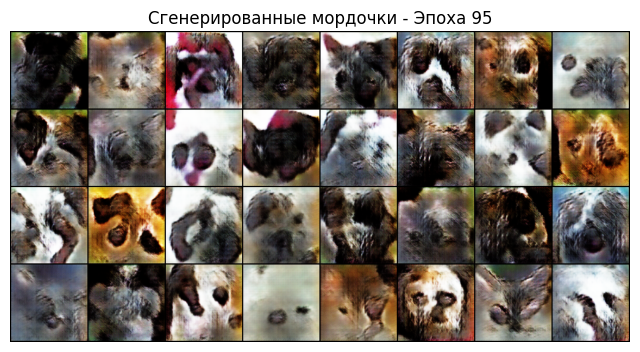

[96/100][0/51] Loss_D: 0.8028 Loss_G: 3.1562
[96/100][25/51] Loss_D: 0.8698 Loss_G: 3.6534
[96/100][50/51] Loss_D: 0.9904 Loss_G: 3.1437
[97/100][0/51] Loss_D: 0.9829 Loss_G: 3.7189
[97/100][25/51] Loss_D: 0.9359 Loss_G: 4.3046
[97/100][50/51] Loss_D: 0.6847 Loss_G: 4.0688
[98/100][0/51] Loss_D: 0.7592 Loss_G: 2.4618
[98/100][25/51] Loss_D: 1.1254 Loss_G: 3.3547
[98/100][50/51] Loss_D: 0.8307 Loss_G: 3.8903
[99/100][0/51] Loss_D: 0.9269 Loss_G: 3.9999
[99/100][25/51] Loss_D: 0.8247 Loss_G: 2.4548
[99/100][50/51] Loss_D: 0.7452 Loss_G: 3.3607
[100/100][0/51] Loss_D: 0.9888 Loss_G: 3.4378
[100/100][25/51] Loss_D: 0.8788 Loss_G: 3.8826
[100/100][50/51] Loss_D: 1.8079 Loss_G: 0.5236


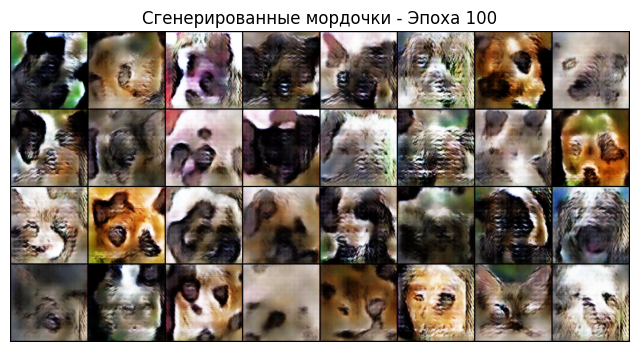

In [ ]:
criterion = nn.BCELoss()
fixed_noise = torch.randn(32, nz, 1, 1, device=device)

lr = 0.00015
beta1 = 0.5
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

num_epochs = 100

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader):
        netD.zero_grad()
        real_cpu = data.to(device)
        b_size = real_cpu.size(0)

        label = torch.full((b_size,), 0.9, dtype=torch.float, device=device)

        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()

        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(0.0)

        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()

        errD = errD_real + errD_fake
        optimizerD.step()

        # Генератор
        netG.zero_grad()
        label.fill_(1.0)

        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        optimizerG.step()

        if i % 25 == 0:
            print(f'[{epoch+1}/{num_epochs}][{i}/{len(dataloader)}] '
                  f'Loss_D: {errD.item():.4f} Loss_G: {errG.item():.4f}')

    if (epoch + 1) % 5 == 0 or epoch == num_epochs - 1:
        with torch.no_grad():
            fake_imgs = netG(fixed_noise).detach().cpu()

        plt.figure(figsize=(8,8))
        plt.axis("off")
        plt.title(f"Сгенерированные мордочки - Эпоха {epoch+1}")
        plt.imshow(np.transpose(vutils.make_grid(fake_imgs, padding=2, normalize=True).cpu(),(1,2,0)))
        plt.show()


Видим, что с помощью GAN на картинках размера 128x128 получилось воспроизвести локальные черты животных (шерсть, например), а вот с общей пространственной связью все похуже как из-за увеличения размера, так и из-за ограничений сверточных слоев.

# Перейдем к VQGAN+CLIP

In [ ]:
# Устанавливаем нужные библиотеки
!pip install ftfy regex tqdm omegaconf pytorch-lightning einops
!pip install git+https://github.com/openai/CLIP.git

# Клонируем репозиторий с архитектурой VQGAN
!git clone https://github.com/CompVis/taming-transformers.git

# Сфкачиваем предобученные веса VQGAN на имаджнете
!mkdir -p checkpoints
!wget -c 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fconfigs%2Fmodel.yaml&dl=1' -O checkpoints/vqgan_imagenet_f16_16384.yaml
!wget -c 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fckpts%2Flast.ckpt&dl=1' -O checkpoints/vqgan_imagenet_f16_16384.ckpt

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-yk0_z1s_
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-yk0_z1s_
  Resolved https://github.com/openai/CLIP.git to commit d05afc436d78f1c48dc0dbf8e5980a9d471f35f6
  Preparing metadata (setup.py) ... done
fatal: destination path 'taming-transformers' already exists and is not an empty directory.
--2026-04-23 20:28:07--  https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fconfigs%2Fmodel.yaml&dl=1
Resolving heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)... 129.206.7.113
Connecting to heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)|129.206.7.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://heibox.uni-heidelberg.de/seafhttp/files/0a0ab406-a56a-4536-8c7c-11df52c6456b/model.yaml [following]
--2026-04-23 20:28:08--  https://heibox.uni-heidelberg.de/seafhttp/files/0a0ab406-a56a-4536-8c7c-11df52c6456b/m

In [ ]:
# 1. Загружаем CLIP (Оценщик)
clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)

# 2. Загружаем VQGAN (Генератор)
config = OmegaConf.load("checkpoints/vqgan_imagenet_f16_16384.yaml")
vqgan_model = VQModel(**config.model.params).to(device)
vqgan_model.eval().requires_grad_(False)
sd = torch.load("checkpoints/vqgan_imagenet_f16_16384.ckpt", map_location="cpu", weights_only=False)["state_dict"]
vqgan_model.load_state_dict(sd, strict=False)

# Трансформсы
augmentations = T.Compose([
    T.RandomResizedCrop(224, scale=(0.5, 1.0)), # Вырезаем случайные куски от 50% до 100% размера
    T.RandomHorizontalFlip(p=0.5),              # Отражаем
    T.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
])

def generate_image_by_text(prompt, iterations=120):
    text_input = clip.tokenize([prompt]).to(device)
    with torch.no_grad():
        text_features = clip_model.encode_text(text_input)

    # Шум
    z = torch.randn(1, 256, 16, 16, requires_grad=True, device=device)

    optimizer = torch.optim.Adam([z], lr=0.15)

    for i in range(iterations):
        optimizer.zero_grad()

        # Квантование (привязка к словарю VQGAN)
        z_q, _, _ = vqgan_model.quantize(z)
        z_q_ste = z + (z_q - z).detach()
        img = vqgan_model.decode(z_q_ste)
        img = (img + 1) / 2.0
        img = img.clamp(0, 1)

        # 16 вырезок объединяем в один батч
        crops = torch.cat([augmentations(img) for _ in range(16)], dim=0)

        # Прогоняем сразу все 16 вырезок через CLIP за один раз
        image_features = clip_model.encode_image(crops)

        # Считаем ошибку (насколько вырезки похожи на текст)
        loss = -torch.cosine_similarity(text_features, image_features).mean()

        loss.backward()
        optimizer.step()

    # Финальная отрисовка
    with torch.no_grad():
        z_q, _, _ = vqgan_model.quantize(z)
        final_img = vqgan_model.decode(z_q)
        final_img = (final_img + 1) / 2.0
        final_img = final_img.clamp(0, 1)[0].permute(1, 2, 0).cpu().numpy()

    return final_img

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Магическая функция теперь РЕАЛЬНО работает, и делает это быстро!


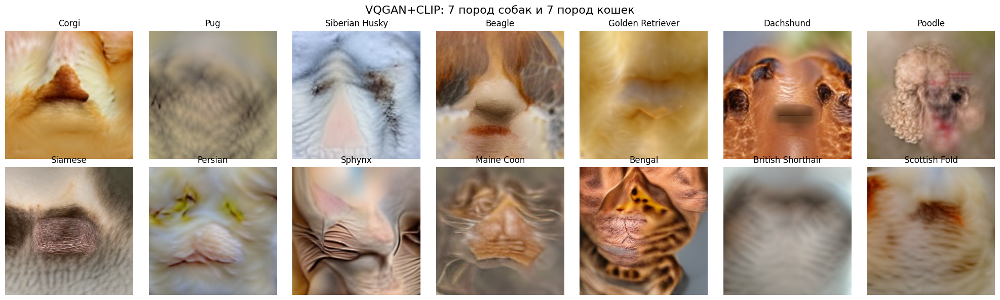

In [ ]:
dogs =[
    "Corgi dog", "Pug dog", "Siberian Husky dog",
    "Beagle dog", "Golden Retriever dog", "Dachshund dog", "Poodle dog"
]

cats =[
    "Siamese cat", "Persian cat", "Sphynx cat",
    "Maine Coon cat", "Bengal cat", "British Shorthair cat", "Scottish Fold cat"
]

all_prompts = dogs + cats
results =[]

fig, axes = plt.subplots(2, 7, figsize=(20, 6))
fig.suptitle("VQGAN+CLIP: 7 пород собак и 7 пород кошек", fontsize=16)

for idx, breed in enumerate(all_prompts):
    prompt = f"A highly detailed, realistic photo of the face of a {breed}"
    print(f"[{idx+1}/{len(all_prompts)}] Генерируем: {breed}...")

    img = generate_image_by_text(prompt, iterations=200)
    results.append((breed, img))

    clear_output(wait=True)
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.title(breed)
    plt.axis("off")
    plt.show()

clear_output(wait=True)
fig, axes = plt.subplots(2, 7, figsize=(20, 6))
fig.suptitle("VQGAN+CLIP: 7 пород собак и 7 пород кошек", fontsize=16)
for i, (breed, img) in enumerate(results):
    ax = axes[i // 7, i % 7]
    ax.imshow(img)
    ax.set_title(breed.replace(" dog", "").replace(" cat", ""), fontsize=12)
    ax.axis("off")

plt.tight_layout()
plt.show()

Видно, что CLIP отлично справляется с направлением генератора в нужную часть латентного пространства. Модель безошибочно генерирует специфичные текстуры (складки сфинкса, пятна бенгала, кудри пуделя).

А вот отсутствие строгой пространственной структуры в генерациях VQGAN+CLIP объясняется природой лосса CLIP (фокус на текстурах и семантике, а не на геометрии), а также минималистичностью реализации (отсутствие Total Variation Loss и малым числом итераций оптимизатора).


Кажется, тоже реди